In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from igraph import Graph, RainbowPalette, plot
import cairo

seed_value = 42
np.random.seed(seed_value)

In [2]:
# Set the default plot aesthetics to be prettier.
colors = ['blue', 'red', 'green', 'purple']

def self_join_df(df):
    # Ensure that the DataFrame has 'user_id' and 'business_id' columns
    if 'user_id' not in df.columns or 'business_id' not in df.columns:
        raise ValueError("DataFrame must contain 'user_id' and 'business_id' columns.")
    
    # Perform a self-join on 'user_id'
    joined_df = df.merge(df, on='user_id', suffixes=('_left', '_right'))
    
    # Filter rows where 'business_id' is different
    result_df = joined_df[joined_df['business_id_left'] != joined_df['business_id_right']]
    
    # Drop unnecessary columns
    result_df = result_df[['user_id', 'business_id_left', 'business_id_right', 'stars_left', 'stars_right']]

    # Reset the index
    result_df.reset_index(drop=True, inplace=True)
    
    return result_df

In [3]:
# Load the restaurant dataset
restaurants = pd.read_csv('data/tucson_restaurants.csv')

# Count the number of categories in each row
restaurants['numcat'] = restaurants['categories'].str.split(',').apply(len)

# filter out rows with 3 categories
df_res = restaurants[restaurants['numcat'] == 3].copy(deep=True)
df_res.reset_index(drop=True, inplace=True)
print('shape .::.', df_res.shape)

# Create a new column for each category
df_res['category1'] = df_res['categories'].str.split(',').apply(lambda x: x[0])
df_res['category2'] = df_res['categories'].str.split(',').apply(lambda x: x[1])
df_res['category3'] = df_res['categories'].str.split(',').apply(lambda x: x[2])

# Drop unnecessary columns
df_res = df_res[['business_id', 'name', 'stars', 'review_count', 'is_open', 'category1', 'category2', 'category3']]
df_res.head()

shape .::. (452, 7)


,business_id,name,stars,review_count,is_open,category1,category2,category3
0,iNMdSi5bmvGSGeRQiUW4dw,Wendy's,2.5,14,1,Fast Food,Burgers,Restaurants
1,UAi8nZY-tCA758y4_8Meuw,Fullylove’s Restaurant,4.5,25,0,Vegan,American (New),Restaurants
2,5N5K-B0pA3as6dvl_ha5BQ,Famous Sam's Restaurant & Bar,2.0,25,0,Burgers,Restaurants,American (Traditional)
3,lhsQkb5nhf-Kd5OvgB9MNg,Sachiko Sushi,3.5,191,1,Japanese,Restaurants,Sushi Bars
4,XyGRDrgCK0z4CiA6nhwEaw,Persian Room Fine Dining,4.5,258,1,Restaurants,Persian/Iranian,Mediterranean


In [4]:
restaurants['categories'].str.split(',').apply(len).value_counts().sort_index()

1       8
2     460
3     452
4     437
5     427
6     310
7     152
8      92
9      60
10     30
11     15
12     13
13      5
14      2
15      2
17      2
18      1
22      1
25      1
Name: categories, dtype: int64

In [5]:
# Load the review dataset
reviews = pd.read_csv('data/tucson_reviews.csv')

# Filter out rows that are not in the restaurant dataset
reviews_df = reviews[reviews['business_id'].isin(df_res['business_id'])].copy(deep=True)

# Reset the index
reviews_df.reset_index(drop=True, inplace=True)

print('Old shape .::.', reviews.shape)
print('New shape .::.', reviews_df.shape)

# Perform self join
joined_df = self_join_df(reviews_df)
# Save the DataFrame to a CSV file
# joined_df.to_csv('output/tucson_reviews_self_joined.csv', index=False)
print('Joined shape .::.', joined_df.shape)
joined_df.head()


Old shape .::. (191113, 9)
New shape .::. (22029, 9)
Joined shape .::. (54076, 5)


,user_id,business_id_left,business_id_right,stars_left,stars_right
0,1yXp7EkfmcxXOomfHxTu-g,B10mqANgHvL8gBteo1UhAA,vzvm7_QXEDaMTxMOKLBNyQ,2,3
1,1yXp7EkfmcxXOomfHxTu-g,B10mqANgHvL8gBteo1UhAA,36rz3AMPh8ETMJq7cTG2Rw,2,2
2,1yXp7EkfmcxXOomfHxTu-g,B10mqANgHvL8gBteo1UhAA,6BZ1gasOkF1mNfmUxfYqhA,2,3
3,1yXp7EkfmcxXOomfHxTu-g,B10mqANgHvL8gBteo1UhAA,dMGWB4TEfEhgInQefGimAw,2,5
4,1yXp7EkfmcxXOomfHxTu-g,B10mqANgHvL8gBteo1UhAA,EwWcloIMj8zflH5Dc16-nw,2,5


In [6]:
joined_df[joined_df.stars_left == joined_df.stars_right].shape

(18258, 5)

In [7]:
# Create an sample of the DataFrame with 5,000 rows and stars_left == stars_right
df_join_sample = joined_df[joined_df.stars_left == joined_df.stars_right].copy(deep=True)
# Create a links dataframe 
links = df_join_sample[['business_id_left', 'business_id_right']].copy(deep=True)
links['weight'] = 5
links.columns = ['source', 'target', 'weight']
links.reset_index(drop=True, inplace=True)
# links.to_csv('output/links.csv', index=False)
links.head()

,source,target,weight
0,B10mqANgHvL8gBteo1UhAA,36rz3AMPh8ETMJq7cTG2Rw,5
1,vzvm7_QXEDaMTxMOKLBNyQ,6BZ1gasOkF1mNfmUxfYqhA,5
2,36rz3AMPh8ETMJq7cTG2Rw,B10mqANgHvL8gBteo1UhAA,5
3,6BZ1gasOkF1mNfmUxfYqhA,vzvm7_QXEDaMTxMOKLBNyQ,5
4,dMGWB4TEfEhgInQefGimAw,EwWcloIMj8zflH5Dc16-nw,5


In [8]:
nodes = df_res.drop_duplicates().copy(deep=True)
nodes.reset_index(drop=True, inplace=True)
nodes.columns = ['business_id', 'business_name', 'stars', 'review_count', 'is_open', 'category1', 'category2', 'category3']
# get only business_id in links
nodes = nodes[nodes['business_id'].isin(links['source'])].copy(deep=True)
nodes.reset_index(drop=True, inplace=True)
# nodes.to_csv('output/nodes.csv', index=False)
nodes.head()

,business_id,business_name,stars,review_count,is_open,category1,category2,category3
0,lhsQkb5nhf-Kd5OvgB9MNg,Sachiko Sushi,3.5,191,1,Japanese,Restaurants,Sushi Bars
1,XyGRDrgCK0z4CiA6nhwEaw,Persian Room Fine Dining,4.5,258,1,Restaurants,Persian/Iranian,Mediterranean
2,5Ce3lZksYVkCbrihqylVHQ,Sushi Nara,4.5,159,1,Sushi Bars,Japanese,Restaurants
3,vzvm7_QXEDaMTxMOKLBNyQ,Guilin Chinese,3.5,116,0,Vegetarian,Chinese,Restaurants
4,KAk07Tbv0UsoY-s7RYfepg,C.I. Chu's Mongolian Barbeque,3.5,177,1,Restaurants,Barbeque,Mongolian


In [9]:
# Create a graph from the links and nodes
net = Graph.DataFrame(links, directed=False, use_vids=False, vertices=nodes)

# Graph summary
print(net.summary())

IGRAPH UNW- 104 18258 -- 
+ attr: business_name (v), category1 (v), category2 (v), category3 (v), is_open (v), name (v), review_count (v), stars (v), weight (e)


In [10]:
# Set the layout
my_layout = net.layout_fruchterman_reingold()

# change edge color
net.es['color'] = 'light gray'

# change vertex color
net.vs['color'] = colors

plot(net, layout=my_layout ,edge_arrow_size=0.6, edge_curved = True,vertex_size=15, bbox=(600, 500), vertex_spacing=550, margin= 50)

In [11]:
cliques = net.cliques(min=3, max=3)
triangle_count = [0] * net.vcount()
for i, j, k in cliques:
    triangle_count[i] += 1
    triangle_count[j] += 1
    triangle_count[k] += 1

metrics_dict = {
    "Number of vertices": [net.vcount()],
    "Number of edges": [net.ecount()],
    "Density of the graph": [round(2 * net.ecount() / (net.vcount() * (net.vcount() - 1)),2)],
    "Diameter of the graph": [net.diameter()],
    "Average degree": [round(sum(net.degree()) / net.vcount(), 2)],
    "Maximum degree": [max(net.degree())],
    "Vertex ID with the maximum degree": [net.degree().index(max(net.degree()))],
    "Average number of triangles": [round(sum(triangle_count) / net.vcount(), 2)],
    "Maximum number of triangles": [max(triangle_count)],
    "Vertex ID with the maximum number of triangles": [triangle_count.index(max(triangle_count))],
    "Density": [round(net.density(loops=False), 2)],
    "Undirected diameter": [net.diameter(directed=False, weights=None)],
    "Directed diameter": [net.diameter(directed=True, weights=None)],
    "Weighted undirected diameter": [net.diameter(directed=False, weights="weight")]
}

# Create a Pandas DataFrame from the metrics dictionary
df_metrics = pd.DataFrame(metrics_dict)


df_metrics

,Number of vertices,Number of edges,Density of the graph,Diameter of the graph,Average degree,Maximum degree,Vertex ID with the maximum degree,Average number of triangles,Maximum number of triangles,Vertex ID with the maximum number of triangles,Density,Undirected diameter,Directed diameter,Weighted undirected diameter
0,104,18258,3.41,2,351.12,1058,17,1656.06,3168,63,3.41,2,2,10.0


In [12]:
# get node attributes by id
net.vs[63].attributes()

{'name': '8Mzu_wczdzv9dU_Gr6OR8A',
 'business_name': 'Kazoku',
 'stars': 4.0,
 'review_count': 439,
 'is_open': 1,
 'category1': 'Sushi Bars',
 'category2': ' Japanese',
 'category3': ' Restaurants',
 'color': 'purple'}

In [13]:
# get node attributes by id
net.vs[17].attributes()

{'name': 'wexGsdw5Wz85-hOBx9r2Tg',
 'business_name': 'Ikkyu',
 'stars': 4.5,
 'review_count': 511,
 'is_open': 1,
 'category1': 'Restaurants',
 'category2': ' Ramen',
 'category3': ' Japanese',
 'color': 'red'}

IGRAPH UNW- 104 3495 -- 
+ attr: business_name (v), category1 (v), category2 (v), category3 (v), color (v), is_open (v), name (v), review_count (v), stars (v), weight (e)


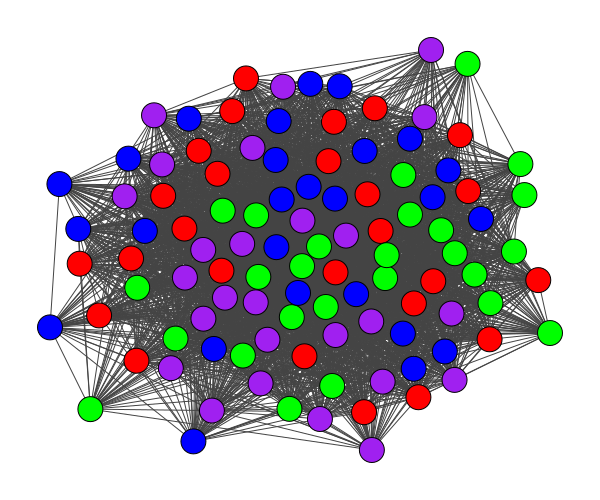

In [14]:
net_simp = net.simplify(multiple=True, loops=False, combine_edges=dict(weight="sum"))

print(net_simp.summary())
plot(net_simp, edge_arrow_size=0.2, vertex_size=25, bbox=(600, 500), vertex_spacing=250, color=colors, margin= 50)

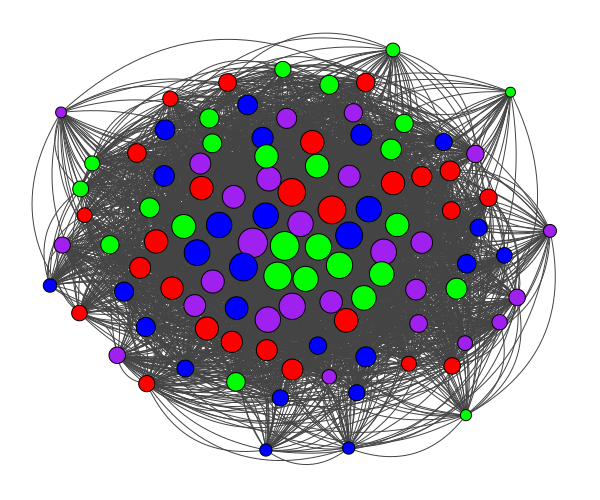

In [15]:
# Node degrees: how many edges are connected to a node
# The mode="ALL" parameter means that it calculates the total degree, considering both incoming and outgoing edges for directed graphs
deg = net.degree(mode="ALL")

# plot the network with node size proportional to degree
plot(net, vertex_size=[d * .3 for d in deg], color=colors, bbox=(600, 500), vertex_spacing=250, edge_curved = True, margin= 50)


In [16]:
community_membership = net.community_multilevel()

community_nodes = {}

# Create a list to store subgraphs for each community
community_subgraphs = []

# Iterate through community memberships and create subgraphs for each community
for community_index in range(max(community_membership.membership) + 1):
    nodes_in_community = [v.index for v in net.vs if community_membership.membership[v.index] == community_index]
    subgraph = net.subgraph(nodes_in_community)
    community_subgraphs.append(subgraph)

# Iterate through community memberships and collect nodes for each community
for community_index in range(max(community_membership.membership) + 1):
    nodes_in_community = [v.index for v in net.vs if community_membership.membership[v.index] == community_index]
    community_nodes[community_index] = nodes_in_community

# Print the nodes in each community
for community_index, nodes_in_community in community_nodes.items():
    print(f"Community {community_index}: Nodes {nodes_in_community}")

# Get the names of the nodes in the first community
# community_nodes = [v['name'] for v in net.vs if community_membership.membership[v.index] == 0]
# print("Community 0:", community_nodes)

Community 0: Nodes [0, 3, 5, 12, 14, 17, 20, 22, 23, 24, 25, 27, 30, 32, 33, 36, 37, 47, 48, 50, 62, 63, 68, 70, 71, 81, 84, 90, 97, 100]
Community 1: Nodes [1, 10, 13, 15, 21, 26, 28, 29, 31, 34, 35, 39, 43, 46, 52, 54, 55, 58, 60, 64, 65, 66, 67, 72, 76, 80, 82, 91, 93, 94, 98, 102, 103]
Community 2: Nodes [2, 4, 6, 7, 9, 16, 18, 19, 38, 40, 41, 42, 44, 45, 49, 51, 53, 59, 69, 75, 78, 79, 83, 85, 86, 87, 88, 89, 92, 95, 96, 101]
Community 3: Nodes [8, 11, 56, 57, 61, 73, 74, 77, 99]


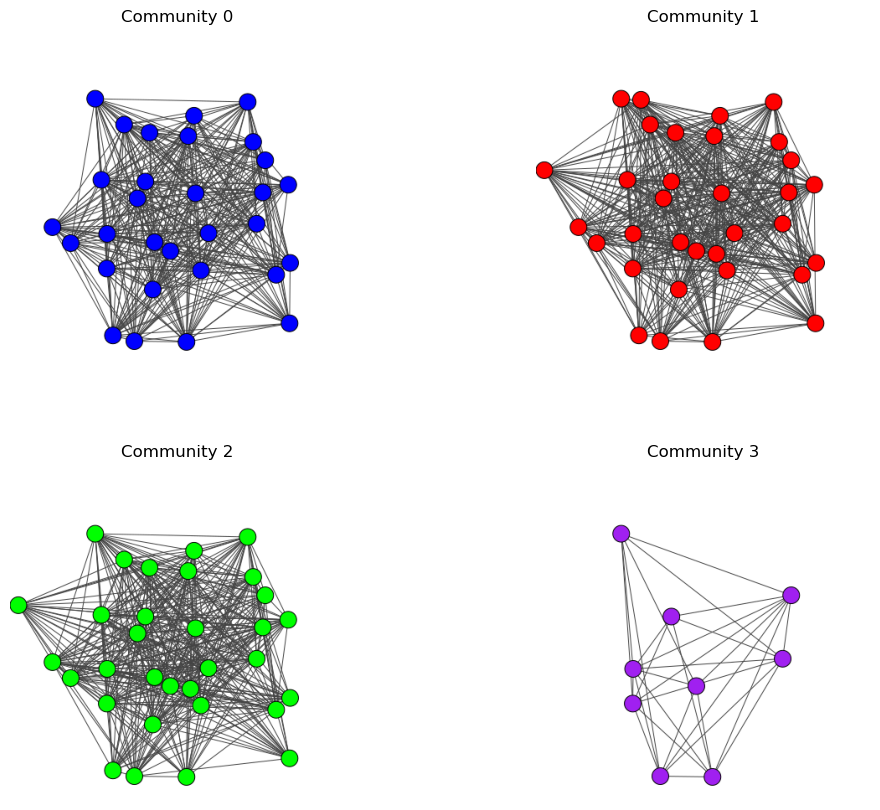

In [17]:

# Create a list of the graphs
layout = net.layout("fr")

# Calculate the number of rows and columns based on the number of subgraphs
num_subgraphs = len(community_subgraphs)
num_rows = 2
num_cols = 2

# Create a figure with subplots arranged in 2 rows and 2 columns
fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, 10))

# Iterate through the subgraphs and create separate plots with custom colors
for idx, (graph, color) in enumerate(zip(community_subgraphs, colors)):
    row = idx // num_cols
    col = idx % num_cols

    # Customize the plot options as needed (e.g., bbox, margin, etc.)
    p = plot(graph, layout=layout, bbox=(400, 400), margin=10, vertex_color=color, target=None)

    # Show the plot in the corresponding subplot
    p.save(f"output/community_{idx}.png")
    axes[row, col].imshow(plt.imread(f"output/community_{idx}.png"))
    axes[row, col].axis('off')
    axes[row, col].set_title(f"Community {idx}")

# Remove empty subplots if there are fewer than 4 subgraphs
for idx in range(num_subgraphs, num_rows * num_cols):
    row = idx // num_cols
    col = idx % num_cols
    fig.delaxes(axes[row, col])

# Adjust the layout of the subplots
plt.subplots_adjust(wspace=0.3, hspace=0.3)  # Adjust the spacing between subplots if needed

# Display the figure
plt.show()


In [18]:
# get node attributes by id
community_subgraphs[0].vs[community_subgraphs[0].degree().index(max(community_subgraphs[0].degree()))].attributes()

{'name': 'FWaU544E0DNj3mkjlKif_Q',
 'business_name': 'Sushi-Ten',
 'stars': 3.5,
 'review_count': 353,
 'is_open': 1,
 'category1': 'Restaurants',
 'category2': ' Sushi Bars',
 'category3': ' Japanese',
 'color': 'blue'}

In [19]:

# get node attributes by id
community_subgraphs[1].vs[community_subgraphs[1].degree().index(max(community_subgraphs[1].degree()))].attributes()

{'name': 'cuYMRqzehT24XJk-YSrExw',
 'business_name': 'Polish Cottage',
 'stars': 4.5,
 'review_count': 290,
 'is_open': 1,
 'category1': 'Polish',
 'category2': ' Restaurants',
 'category3': ' American (New)',
 'color': 'green'}

In [20]:

# get node attributes by id
community_subgraphs[2].vs[community_subgraphs[2].degree().index(max(community_subgraphs[2].degree()))].attributes()

{'name': 'B10mqANgHvL8gBteo1UhAA',
 'business_name': "Caruso's",
 'stars': 3.5,
 'review_count': 381,
 'is_open': 1,
 'category1': 'Restaurants',
 'category2': ' Italian',
 'category3': ' Pizza',
 'color': 'green'}

In [21]:
# get node attributes by id
community_subgraphs[3].vs[community_subgraphs[3].degree().index(max(community_subgraphs[3].degree()))].attributes()

{'name': 'SVJJIoAiW3vHwoSpVnUcLQ',
 'business_name': 'Pastiche Modern Eatery',
 'stars': 3.5,
 'review_count': 313,
 'is_open': 1,
 'category1': 'American (New)',
 'category2': ' American (Traditional)',
 'category3': ' Restaurants',
 'color': 'blue'}

In [22]:
community_metrics = []

# Iterate through the community subgraphs
for idx, subgraph in enumerate(community_subgraphs):
    # Calculate metrics for the current community
    density = round(subgraph.density(loops=False),2)
    average_degree = round(sum(subgraph.degree()) / len(subgraph.degree()),2)
    diameter = subgraph.diameter(directed=False, weights=None)
    is_connected = subgraph.is_connected()
    num_nodes = len(subgraph.vs)
    num_edges = len(subgraph.es)
    
    # Calculate additional metrics
    # betweenness_centrality = subgraph.betweenness()
    # cluster_coefficient = subgraph.transitivity_local_undirected(mode="zero")
    # eigenvector_centrality = subgraph.eigenvector_centrality()
    # pagerank = subgraph.pagerank()
    # closeness_centrality = subgraph.closeness(normalized=True)

# Append metrics to the community_metrics list
    community_metrics.append({
        "Community": f"Community {idx}",
        "Density": density,
        "Average Degree": average_degree,
        "Diameter": diameter,
        "Is Connected": is_connected,
        "Number of Nodes": num_nodes,
        "Number of Edges": num_edges,
        # "Betweenness Centrality": betweenness_centrality,
        # "Cluster Coefficient": cluster_coefficient,
        # "Eigenvector Centrality": eigenvector_centrality,
        # "PageRank": pagerank,
        # "Closeness Centrality": closeness_centrality
    })

# Create a Pandas DataFrame from the list of dictionaries
df_community_metrics = pd.DataFrame(community_metrics)

df_community_metrics

,Community,Density,Average Degree,Diameter,Is Connected,Number of Nodes,Number of Edges
0,Community 0,0.81,23.60,2,True,30,354
1,Community 1,0.83,26.48,2,True,33,437
2,Community 2,0.81,25.12,2,True,32,402
3,Community 3,0.83,6.67,2,True,9,30


In [23]:
# Get the names of the nodes in the first community
community_nodes = [v['name'] for v in net.vs if community_membership.membership[v.index] == 1]
print("Community 0:", community_nodes)

# Generate a datasets of the nodes in the first community

t_biz = pd.read_csv('data/tucson_business.csv')
print(' Business Shape.::. ', t_biz[t_biz['business_id'].isin(community_nodes)].shape)

t_res = pd.read_csv('data/tucson_restaurants.csv')
print(' Restaurants Shape.::. ', t_res[t_res['business_id'].isin(community_nodes)].shape)

t_rev = pd.read_csv('data/tucson_reviews.csv')
print(' Reviews Shape.::. ', t_rev[t_rev['business_id'].isin(community_nodes)].shape)

t_users = pd.read_csv('data/tucson_users.csv')
print(' Users Shape.::. ', t_users[t_users['user_id'].isin(t_rev[t_rev['business_id'].isin(community_nodes)]['user_id'].unique())].shape)


# Save the datasets to CSV files
# t_rev[t_rev['business_id'].isin(community_nodes)].to_csv('output/review_community_1.csv', index=False)
# t_res[t_res['business_id'].isin(community_nodes)].to_csv('output/restaurant_community_1.csv', index=False)
# t_biz[t_biz['business_id'].isin(community_nodes)].to_csv('output/business_community_1.csv', index=False)
# t_users[t_users['user_id'].isin(t_rev[t_rev['business_id'].isin(community_nodes)]['user_id'].unique())].to_csv('output/user_community_1.csv', index=False)

Community 0: ['XyGRDrgCK0z4CiA6nhwEaw', 'p7tSGmWpFV246aYhwODgBg', 'aDL_KdxbDRT5s51Jtn9V5g', 'wzPc5d1l0PpxQLQDhh8T2w', '5CX7rtnwYnmqFCihOyWivg', 'cuYMRqzehT24XJk-YSrExw', 'LIcsCCOYqBO9k2tiO4Mrow', 'QCPUoVbzkTAu1gkCrZlPaQ', 'UU9jmX08ZRU9DLI36wsKnA', 'dkEgU5UNNed9Rhn91Whuhw', 'ZHcfV3d7ZW8bmwgKCsz-RA', 'mTnp8g8vFnuJso_NK7sR4A', '5XJsZt4HFjSbAdc4dkWVKQ', 'DU2KrvS9kBBV-HwzE2fQrA', '5YRHE2foNVmv1n8VIJcb-A', 'AbeWP7_Vxhp45I9IPZ7Otg', 'eIk4_wRFDQGH7UOYF6maJA', 'eGi7CE2YaN6YMiGyXNi8XQ', 'zL7wVx6Ihf1VEb9Wi7P0bw', '_uDhUdcNBtgiOXPGPWunoQ', 'o3woQWQ-0HxFftItIEeNdw', 'QdPiEDjZ2N2mOXSCrWHAbw', 'ab8i075-Tjju3WvcsXTp0g', 'a_oRfgkNFnulTada--P_Tg', 'dlOTtFJbcyN1m5PR2IDxOg', 'nEaTbGFlU7d9eLU2kl6KBw', 'ta8tixXzHXFogPiYlB2a5A', 'YmVueFcpVEFdGfJyT7rvtQ', 'MSKQTsQvBKfLRtkni9icSA', 'dMGWB4TEfEhgInQefGimAw', 'Zg83olSjsdXAhE5EEy5IcQ', '2njTjQ35skXN171KoobeGg', 'kEVptUKa_OUPn_50sTmoTQ']
 Business Shape.::.  (33, 14)
 Restaurants Shape.::.  (33, 6)
 Reviews Shape.::.  (6918, 9)
 Users Shape.::.  (5362, 22)


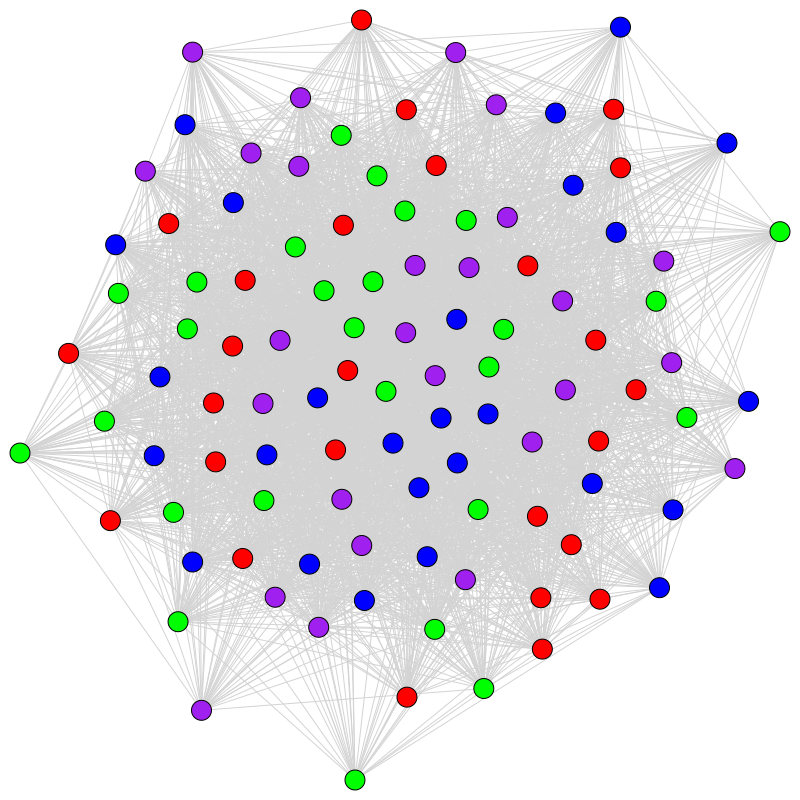

In [24]:
# Create a layout for the graph
layout = net.layout("fr")

# change edge color
net.es['color'] = 'light gray'

# Create a plot with vertex colors representing communities
plot(net, layout=layout, bbox=(800, 800), margin=20, vertex_color=colors)

In [25]:
degree_centrality = net_simp.degree()
betweenness_centrality = net_simp.betweenness()
cluster_coeff = net_simp.transitivity_local_undirected(mode="zero")
# calculate the eigenvector centrality
eigenvector_centrality = net_simp.eigenvector_centrality(directed=False, weights="weight")
# calculate the pagerank
pagerank = net_simp.pagerank(directed=False, weights="weight")
# calculate closeness centrality
closeness_centrality = net_simp.closeness(normalized=True)

# Combine the centrality measures and cluster coefficients into a dictionary
node_metrics = {
    "Degree Centrality": degree_centrality,
    "Betweenness Centrality": betweenness_centrality,
    "Cluster Coefficient": cluster_coeff,
    "Eigenvector Centrality": eigenvector_centrality,
    "PageRank": pagerank,
    "Closeness Centrality": closeness_centrality,
}

# Sort the nodes by the chosen metric (e.g., "Degree Centrality")
sorted_nodes = sorted(range(len(net.vs)), key=lambda x: node_metrics["Degree Centrality"][x], reverse=True)

# Get the top 10 nodes based on the chosen metric
top_10_nodes = sorted_nodes[:10]

print('Top Nodes.::.', top_10_nodes)


# Print the top 10 nodes and their metric values
top_10_data = []
for node in top_10_nodes:
    node_data = {"Node": node}
    for metric_name, metric_values in node_metrics.items():
        node_data[metric_name] = metric_values[node]
    top_10_data.append(node_data)

# Create a DataFrame from the list of dictionaries
top_10_df = pd.DataFrame(top_10_data)

# Print the DataFrame
top_10_df

Top Nodes.::. [63, 26, 6, 77, 100, 17, 44, 27, 50, 82]


,Node,Degree Centrality,Betweenness Centrality,Cluster Coefficient,Eigenvector Centrality,PageRank,Closeness Centrality
0,63,98,43.287415,0.666526,0.731010,0.020071,0.953704
1,26,96,43.409845,0.659211,0.694286,0.018827,0.936364
2,6,93,40.552450,0.663394,0.401055,0.014109,0.911504
3,77,93,37.899475,0.675316,0.734109,0.020733,0.911504
4,100,93,35.148303,0.684899,0.559516,0.017061,0.911504
5,17,92,34.189917,0.691352,1.000000,0.025681,0.903509
6,44,90,35.893631,0.678152,0.552307,0.016017,0.887931
7,27,88,31.235638,0.691484,0.322684,0.010200,0.872881
8,50,88,30.145344,0.688610,0.657510,0.018584,0.872881
9,82,88,32.536181,0.687827,0.469154,0.014128,0.872881


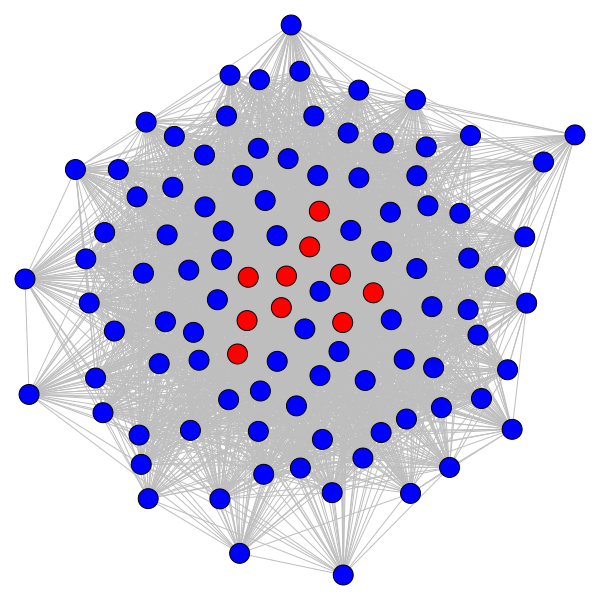

In [26]:
# Create a layout for the graph
layout = net_simp.layout_fruchterman_reingold()

# change edge color
net_simp.es['color'] = 'gray'

# Create a plot and highlight the top 10 nodes using the vertex_color parameter
plot(net_simp, layout=layout, margin=25, edge_arrow_size=0.2, vertex_size=20, bbox=(600, 600), vertex_spacing=350, vertex_color=["red" if v.index in top_10_nodes else "blue" for v in net_simp.vs])

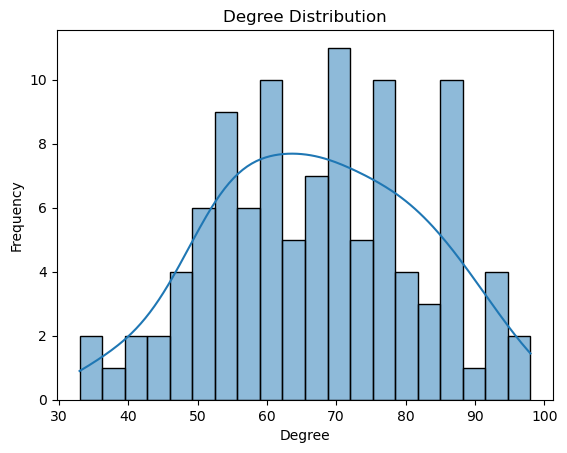

In [27]:
sns.histplot(deg, bins=20, kde=True)
plt.xlabel("Degree")
plt.ylabel("Frequency")
plt.title("Degree Distribution")
plt.show()

Vertices in the largest connected component: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103]


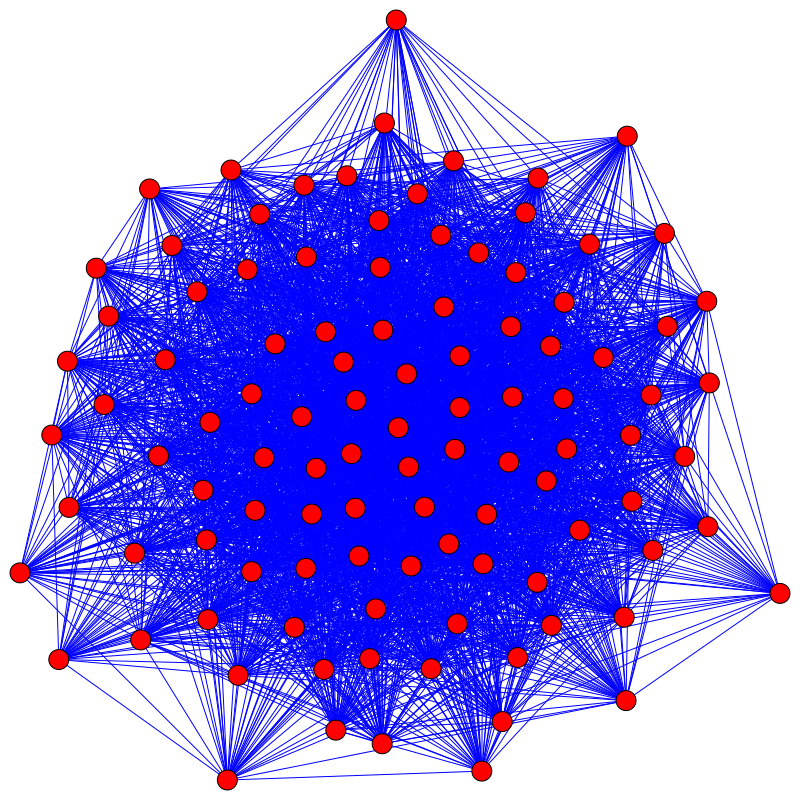

In [28]:
# Find connected components
components = net.components()

# Get the largest connected component
largest_component = max(components, key=len)

# Perform any analysis on the largest connected component
print("Vertices in the largest connected component:", largest_component)

# change color of nodes in largest component
net.vs["color"] = ["red" if v.index in largest_component else "blue" for v in net.vs]

# change color of edges in largest component
net.es["color"] = ["blue" if e.source in largest_component and e.target in largest_component else "red" for e in net.es]

# Plot the largest connected component
plot(net.subgraph(largest_component), bbox=(800, 800), vertex_spacing=250)